In [1]:
import os, sys
import re
import time
from collections import Counter

import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.patches as patches

import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data.dataset import Dataset
from torch.utils.data import DataLoader

import pandas as pd
import cv2
import copy
from tqdm import tqdm

In [3]:
# Install a pip package in the current Jupyter kernel
# import sys
# !{sys.executable} -m pip install --user bbox

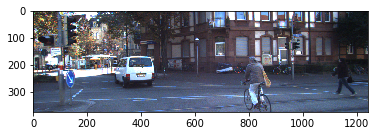

In [2]:
img_dir = "/projectnb/cs591dl/shawnlin/object-tracking/dataset/data_tracking_image_2/training/image_02/0000/"
# img = mpimg.imread(img_dir + "000000.png")
img = cv2.imread(img_dir + "000000.png", cv2.IMREAD_COLOR)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()

In [3]:
# Load label txt for video
HEADER = [
    "frame",
    "track_id",
    "type",
    "truncated",
    "occluded",
    "alpha",
    "bbox_l",
    "bbox_t",
    "bbox_r",
    "bbox_b",
    "dim_h",
    "dim_w",
    "dim_l",
    "loc_x",
    "loc_y",
    "loc_z",
    "rot_y",
    "score"
]

lab_dir = "/projectnb/cs591dl/shawnlin/object-tracking/dataset/data_tracking_label_2/training/label_02/"
label = pd.read_csv(lab_dir + "0000.txt",  sep=" ", names=HEADER)
label

,frame,track_id,type,truncated,occluded,alpha,bbox_l,bbox_t,bbox_r,bbox_b,dim_h,dim_w,dim_l,loc_x,loc_y,loc_z,rot_y,score
0,0,-1,DontCare,-1,-1,-10.000000,219.310000,188.490000,245.500000,218.560000,-1000.000000,-1000.000000,-1000.000000,-10.000000,-1.000000,-1.000000,-1.000000,NaN
1,0,-1,DontCare,-1,-1,-10.000000,47.560000,195.280000,115.480000,221.480000,-1000.000000,-1000.000000,-1000.000000,-10.000000,-1.000000,-1.000000,-1.000000,NaN
2,0,0,Van,0,0,-1.793451,296.744956,161.752147,455.226042,292.372804,2.000000,1.823255,4.433886,-4.552284,1.858523,13.410495,-2.115488,NaN
3,0,1,Cyclist,0,0,-1.936993,737.619499,161.531951,931.112229,374.000000,1.739063,0.824591,1.785241,1.640400,1.675660,5.776261,-1.675458,NaN
4,0,2,Pedestrian,0,0,-2.523309,1106.137292,166.576807,1204.470628,323.876144,1.714062,0.767881,0.972283,6.301919,1.652419,8.455685,-1.900245,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1084,153,10,Car,0,2,-1.818856,680.294919,177.511028,842.313244,284.070033,1.524000,1.728591,3.894227,2.353367,1.622590,12.436503,-1.637280,NaN
1085,153,11,Car,0,2,1.864481,245.920800,194.456182,394.817829,286.444967,1.444000,1.595116,3.791789,-5.458963,1.908188,13.979427,1.497916,NaN
1086,153,12,Pedestrian,1,0,0.826456,1185.199080,151.165841,1241.000000,348.552707,1.688000,0.800000,0.884000,5.739732,1.500532,6.279632,1.543272,NaN
1087,153,13,Car,0,0,1.773993,344.361560,188.772369,430.531955,248.482384,1.422414,1.512803,3.707634,-6.033258,1.888008,19.788795,1.481180,NaN


In [4]:
# Get label at frame 0
label[label["frame"] == 0]

,frame,track_id,type,truncated,occluded,alpha,bbox_l,bbox_t,bbox_r,bbox_b,dim_h,dim_w,dim_l,loc_x,loc_y,loc_z,rot_y,score
0,0,-1,DontCare,-1,-1,-10.000000,219.310000,188.490000,245.500000,218.560000,-1000.000000,-1000.000000,-1000.000000,-10.000000,-1.000000,-1.000000,-1.000000,NaN
1,0,-1,DontCare,-1,-1,-10.000000,47.560000,195.280000,115.480000,221.480000,-1000.000000,-1000.000000,-1000.000000,-10.000000,-1.000000,-1.000000,-1.000000,NaN
2,0,0,Van,0,0,-1.793451,296.744956,161.752147,455.226042,292.372804,2.000000,1.823255,4.433886,-4.552284,1.858523,13.410495,-2.115488,NaN
3,0,1,Cyclist,0,0,-1.936993,737.619499,161.531951,931.112229,374.000000,1.739063,0.824591,1.785241,1.640400,1.675660,5.776261,-1.675458,NaN
4,0,2,Pedestrian,0,0,-2.523309,1106.137292,166.576807,1204.470628,323.876144,1.714062,0.767881,0.972283,6.301919,1.652419,8.455685,-1.900245,NaN


In [5]:
# Traverse training set and label

train_dir = "/projectnb/cs591dl/shawnlin/object-tracking/dataset/data_tracking_image_2/training/image_02/"
train_label_dir = "/projectnb/cs591dl/shawnlin/object-tracking/dataset/data_tracking_label_2/training/label_02/"

# image_class_info = {}
image_class_info = pd.DataFrame(columns=["video_id", "frame_id", "class", "image_path"])

for dirname in sorted(os.listdir(train_dir)):
    tot_frame = 0
    # Get corresponding train labels
    label = pd.read_csv(train_label_dir + dirname + ".txt", sep=" ", names=HEADER)
    # Traverse image dir
    for filename in sorted(os.listdir(train_dir + dirname)):
        tot_frame += 1
        image_path = train_dir + dirname + "/" + filename

        # parse frame id from filename
        cur_frame_id = int(re.sub(r"\.png", "", filename))
        
        # select label rows with corresponding frame id
        cur_label = label[label["frame"] == cur_frame_id]
        types = list(cur_label["type"])
        
        pedestrian_labels = cur_label[cur_label["type"] == "Pedestrian"]
        bbox_l = ",".join([str(v) for v in pedestrian_labels["bbox_l"].tolist()])
        bbox_t = ",".join([str(v) for v in pedestrian_labels["bbox_t"].tolist()])
        bbox_r = ",".join([str(v) for v in pedestrian_labels["bbox_r"].tolist()])
        bbox_b = ",".join([str(v) for v in pedestrian_labels["bbox_b"].tolist()])
        
        new_row = {"video_id": dirname,
                   "frame_id": cur_frame_id,
                   "class": 0,
                   "image_path": image_path,
                   "bbox_l": bbox_l,
                   "bbox_t": bbox_t,
                   "bbox_r": bbox_r,
                   "bbox_b": bbox_b}
        
        # detect class-0 / class-1(w/t pedestrian)
        if "Pedestrian" in types:
            new_row["class"] = 1
        
        image_class_info = image_class_info.append(new_row, ignore_index=True)
        
        # print("  %s => types: [%s]" % (filename, ", ".join(types)))
    print("Total frames for video %s: %i" % (dirname, tot_frame))
    

Total frames for video 0000: 154
Total frames for video 0001: 447
Total frames for video 0002: 233
Total frames for video 0003: 144
Total frames for video 0004: 314
Total frames for video 0005: 297
Total frames for video 0006: 270
Total frames for video 0007: 800
Total frames for video 0008: 390
Total frames for video 0009: 803
Total frames for video 0010: 294
Total frames for video 0011: 373
Total frames for video 0012: 78
Total frames for video 0013: 340
Total frames for video 0014: 106
Total frames for video 0015: 376
Total frames for video 0016: 209
Total frames for video 0017: 145
Total frames for video 0018: 339
Total frames for video 0019: 1059
Total frames for video 0020: 837


In [6]:
# Class 1 & class 0 count
counts = image_class_info.groupby(["class"]).size()
ratio = counts[1]/counts[0]
print(counts, ratio)

class
0    5479
1    2529
dtype: int64 0.4615805803978828


In [7]:
# Balance class 0 and 1
a = image_class_info[image_class_info["class"] == 0].sample(frac=ratio)
b = image_class_info[image_class_info["class"] == 1].sample(frac=1)
balanced_image_class_info = a.append(b)
balanced_image_class_info

,video_id,frame_id,class,image_path,bbox_b,bbox_l,bbox_r,bbox_t
3679,0009,630,0,/projectnb/cs591dl/shawnlin/object-tracking/da...,,,,
4453,0011,307,0,/projectnb/cs591dl/shawnlin/object-tracking/da...,,,,
7719,0020,548,0,/projectnb/cs591dl/shawnlin/object-tracking/da...,,,,
3174,0009,125,0,/projectnb/cs591dl/shawnlin/object-tracking/da...,,,,
3936,0010,84,0,/projectnb/cs591dl/shawnlin/object-tracking/da...,,,,
...,...,...,...,...,...,...,...,...
702,0002,101,1,/projectnb/cs591dl/shawnlin/object-tracking/da...,225.90851899999998,442.15044400000005,460.803083,169.805735
6217,0019,105,1,/projectnb/cs591dl/shawnlin/object-tracking/da...,"298.863163,324.47437599999995,256.390228,232.8...","893.475007,202.365306,456.928926,520.817758,57...","951.5894109999999,254.45814,485.52260700000005...","167.896345,187.519898,174.53456,179.463943,177..."
6491,0019,379,1,/projectnb/cs591dl/shawnlin/object-tracking/da...,"373.0,373.0,373.0,341.087114,327.566527,351.38...","161.658472,275.976533,126.728874,111.714539999...","351.40934500000003,361.710341,202.207667,183.1...","158.11476399999998,170.646794,172.015531,176.5..."
4146,0011,0,1,/projectnb/cs591dl/shawnlin/object-tracking/da...,"210.70184500000002,230.42940299999998,198.2910...","660.7271929999999,113.656451,899.8737679999999...","676.393859,127.98978500000001,907.373767999999...","170.51101699999998,166.84413899999998,160.6826..."


In [10]:
# Get the average size of the image
# accum_shape = None
# for path in tqdm(balanced_image_class_info["image_path"].tolist()[:]):
#     img = cv2.imread(path, cv2.IMREAD_COLOR)
#     img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#     if accum_shape is None:
#         accum_shape = np.array(img.shape)
#     else:
#         accum_shape += np.array(img.shape)
# accum_shape = accum_shape / len(balanced_image_class_info["image_path"].tolist())
# accum_shape

In [8]:
# Split into Train/Val/Test
# TODO: Cross validation?

shuffled_image_class_info = balanced_image_class_info.sample(frac = 1.0)

TRAIN_SIZE = int(len(shuffled_image_class_info) * 0.7)
VAL_SIZE = int(len(shuffled_image_class_info) * 0.1)
TEST_SIZE = int(len(shuffled_image_class_info) * 0.2)


train_img_class_info = shuffled_image_class_info[:TRAIN_SIZE]
val_img_class_info = shuffled_image_class_info[TRAIN_SIZE:TRAIN_SIZE+VAL_SIZE]
test_img_class_info = shuffled_image_class_info[TRAIN_SIZE+VAL_SIZE:]

print("Train size: %s" % len(train_img_class_info))
print("Val size: %s" % len(val_img_class_info))
print("Test size: %s" % len(test_img_class_info))


Train size: 3540
Val size: 505
Test size: 1013


In [9]:
def get_iou(bb1, bb2):
    """
    Calculate the Intersection over Union (IoU) of two bounding boxes.

    Parameters
    ----------
    bb1 : dict
        Keys: {'x1', 'x2', 'y1', 'y2'}
        The (x1, y1) position is at the top left corner,
        the (x2, y2) position is at the bottom right corner
    bb2 : dict
        Keys: {'x1', 'x2', 'y1', 'y2'}
        The (x, y) position is at the top left corner,
        the (x2, y2) position is at the bottom right corner

    Returns
    -------
    float
        in [0, 1]
    """
#     assert bb1['x1'] < bb1['x2']
#     assert bb1['y1'] < bb1['y2']
#     assert bb2['x1'] < bb2['x2']
#     assert bb2['y1'] < bb2['y2']

    # determine the coordinates of the intersection rectangle
    x_left = max(bb1['x1'], bb2['x1'])
    y_top = max(bb1['y1'], bb2['y1'])
    x_right = min(bb1['x2'], bb2['x2'])
    y_bottom = min(bb1['y2'], bb2['y2'])

    if x_right < x_left or y_bottom < y_top:
        return 0.0

    # The intersection of two axis-aligned bounding boxes is always an
    # axis-aligned bounding box
    intersection_area = (x_right - x_left) * (y_bottom - y_top)

    # compute the area of both AABBs
    bb1_area = (bb1['x2'] - bb1['x1']) * (bb1['y2'] - bb1['y1'])
    bb2_area = (bb2['x2'] - bb2['x1']) * (bb2['y2'] - bb2['y1'])

    # compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the interesection area
    #iou = intersection_area / float(bb1_area + bb2_area - intersection_area)
    #assert iou >= 0.0
    #assert iou <= 1.0
    if float(bb2_area) == 0.0:
        return 0.0
    return float(intersection_area)/float(bb2_area)

a1 = {"x1": 400, "x2": 624, "y1": 0, "y2": 224}
a2 = {"x1": 230, "x2": 261, "y1": 169, "y2": 255} #514 573 88 195 #230 261 169 255
get_iou(a1, a2)

# from bbox import BBox2D, XYXY
# from bbox.metrics import jaccard_index_2d

# a1 = BBox2D([400, 0, 624, 224], mode=XYXY)
# a2 = BBox2D([230, 169, 230, 255], mode=XYXY)
# jaccard_index_2d(a1, a2)

0.0

0it [00:00, ?it/s]

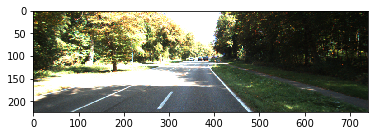

False


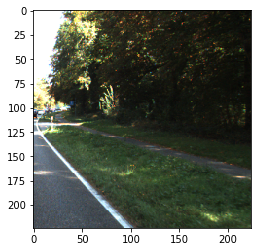

1it [00:00,  2.45it/s]

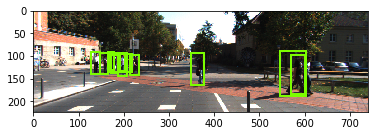

True


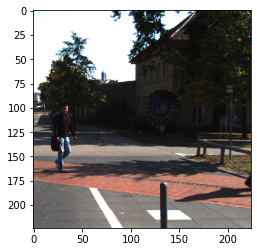

2it [00:00,  2.45it/s]

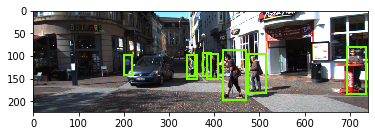

True


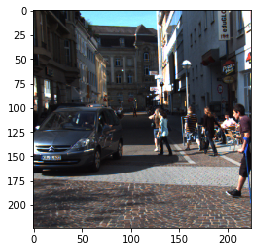

3it [00:01,  2.36it/s]

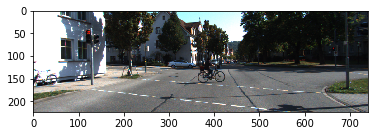

False


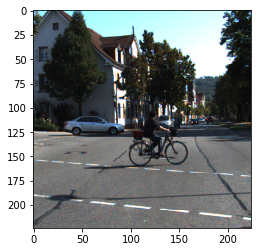

4it [00:01,  2.30it/s]

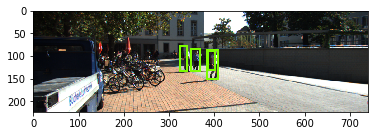

True


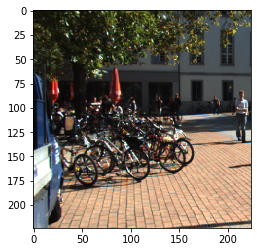

5it [00:02,  2.33it/s]

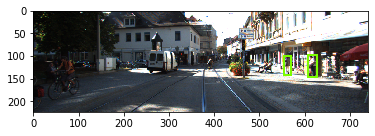

False


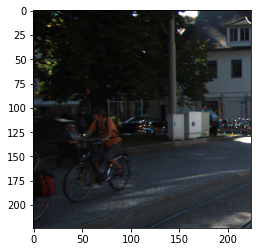

6it [00:02,  2.33it/s]

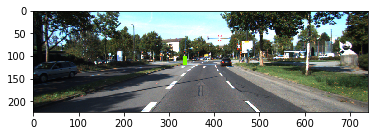

True


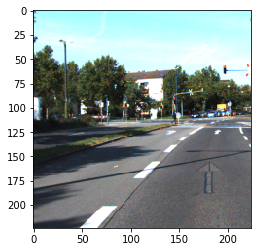

6it [00:02,  2.00it/s]


In [10]:
# for i, (index, row) in tqdm(enumerate(balanced_image_class_info[balanced_image_class_info["class"] == 1].iterrows())):
for i, (index, row) in tqdm(enumerate(train_img_class_info.iterrows())):
    img = cv2.imread(row["image_path"], cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    img_resize = cv2.resize(img, (int(img.shape[1]*224/img.shape[0]), 224))
    plt.imshow(img_resize)    
    # mask = np.zeros((img_resize.shape[0], img_resize.shape[1]))
    
    # Cropping and detecting bounding box IoU
    crop_idx = np.random.randint(0, img_resize.shape[1]-224)
    img_crop = img_resize[:, crop_idx:crop_idx+224]
    has_full_pedestrian = False

    # Using bounding box info
    if row["bbox_l"] != "":
        ax = plt.gca()
        for tup in zip(row["bbox_l"].split(","), row["bbox_t"].split(","), row["bbox_r"].split(","), row["bbox_b"].split(",")):
            bbox_l = int(float(tup[0])*740/1240)
            bbox_t = int(float(tup[1])*224/375)
            bbox_r = int(float(tup[2])*740/1240)
            bbox_b = int(float(tup[3])*224/375)

            # mask[bbox_t: bbox_b, bbox_l:bbox_r] = 1.0

            # Calculate IoU?
            crop_box = {"x1": crop_idx, "x2": crop_idx+224, "y1": 0, "y2": 224}
            obj_box = {"x1": bbox_l, "x2": bbox_r, "y1": bbox_t, "y2": bbox_b}
            coverage = get_iou(crop_box, obj_box)
            if coverage > 0.79:
                has_full_pedestrian = True
            rect = patches.Rectangle((bbox_l, bbox_t), (bbox_r - bbox_l), (bbox_b - bbox_t), linewidth=2, edgecolor='lawngreen', facecolor='none', label="%.2f"%coverage)
            ax.add_patch(rect)
    plt.show()
    
    plt.imshow(img_crop)
    print(has_full_pedestrian)
    plt.show()
    
    if i > 5: break

In [2]:
# Define model

model = torchvision.models.resnet152(pretrained=True)
for param in model.parameters():
    param.requires_grad = False

# Parameters of newly constructed modules have requires_grad=True by default
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 1)
model = model.cuda()
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

torch.Size([224, 224, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


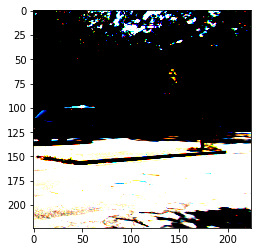

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0
<class 'torch.Tensor'>
torch.Size([224, 224, 3])


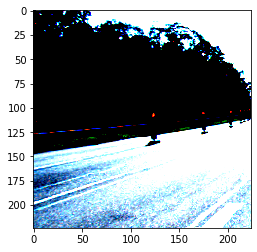

0.0
<class 'torch.Tensor'>


In [10]:
# Dataset wrapper

def collate_fn(seq_list):
    img, target = zip(*seq_list)
    #print("collate", target, len(target))
    #imgT = torch.stack([i for i in img])
    targets = [t for t in target]
    imgT = torch.stack([i for i in img])
#     imgT = [i for i in img]
#     imgT = torch.LongTensor(imgT)
    #print("collate_after", targets)
    return (imgT, targets)

class KittiDataset(Dataset):
    def __init__(self, image_class_info):
        # TODO: maybe put the whole preprocess thing here?
        self.img_class_info = image_class_info
        self.transform = transforms.Compose([transforms.ToTensor(),
                                             transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                                  std=[0.229, 0.224, 0.225])])

        
    def __getitem__(self, index):
        row = self.img_class_info.iloc[index]
        img = cv2.imread(row["image_path"], cv2.IMREAD_COLOR)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_resize = cv2.resize(img, (740, 224))

        # Cropping to 224x224 considering bounding box labels
        if row["class"] == 1:
            # Parse bboxes in image
            bbox_ls = [float(v) for v in row["bbox_l"].split(",")]
            bbox_ts = [float(v) for v in row["bbox_t"].split(",")]
            bbox_rs = [float(v) for v in row["bbox_r"].split(",")]
            bbox_bs = [float(v) for v in row["bbox_b"].split(",")]
            #print("Crop bound: [%.2f ~ %.2f]" % (min(bbox_ls), max(bbox_ls)))
            crop_idx = np.random.randint(min(img_resize.shape[1]-224, max(0, int(min(bbox_ls)))), min(int(max(bbox_ls)), img_resize.shape[1]-224)+1)
        else:
            crop_idx = np.random.randint(0, img_resize.shape[1]-224)
        img_crop = img_resize[:, crop_idx:crop_idx+224]
        assert(crop_idx >= 0)
        
        
        target = {}
        label = 1.0 if row["class"] == 1 else 0.0
        bboxs = []
        
        # Using bounding box info 
        if row["class"] == 1:
            for (bbox_l, bbox_t, bbox_r, bbox_b) in zip(bbox_ls, bbox_ts, bbox_rs, bbox_bs):
                bbox_l *= (740/1240)
                bbox_t *= (224/375)
                bbox_r *= (740/1240)
                bbox_b *= (224/375)

                # Calculate IoU?
                #crop_box = BBox2D([crop_idx, 0, crop_idx+224, 224], mode=XYXY)
                #obj_box = BBox2D([bbox_l, bbox_t, bbox_r, bbox_b], mode=XYXY)
                crop_box = {"x1": crop_idx, "x2": crop_idx+224, "y1": 0, "y2": 224}
                obj_box = {"x1": bbox_l, "x2": bbox_r, "y1": bbox_t, "y2": bbox_b}
                # Positive tile if any of the pedestrian bounding box has a coverage of over 80%
                coverage = get_iou(crop_box, obj_box)

                if coverage > 0.1:
                    bboxs.append([bbox_l-crop_idx, bbox_r-crop_idx, bbox_t, bbox_b]) # need to subtract crop_idx for x coord so that the box can fit.

        target["label"] = label
        target["bboxs"] = bboxs

        imgT = self.transform(img_crop)
        #print(imgT.shape, img_crop.shape)
        return (imgT, target)

    def __len__(self):
        return len(self.img_class_info)

tr_dataset = KittiDataset(train_img_class_info)
tst_dataset = KittiDataset(test_img_class_info)
val_dataset = KittiDataset(val_img_class_info)

dataloaders = {
    "train": DataLoader(tr_dataset, batch_size=8, shuffle=False, num_workers=2, collate_fn=collate_fn),
    "val": DataLoader(val_dataset, batch_size=8, shuffle=False, num_workers=2, collate_fn=collate_fn),
    "test": DataLoader(tst_dataset, batch_size=8, shuffle=False, num_workers=1, collate_fn=collate_fn)
}
tr_loader = DataLoader(tr_dataset, batch_size=1, shuffle=False, num_workers=1, collate_fn=collate_fn)

for batch_id, (imgT, targetT) in enumerate(tr_loader):
    if batch_id > 1: break
    
    # For debug visualization
    for img, target in zip(imgT, targetT):
        raw_img = img.permute(1, 2, 0)
        print(raw_img.shape)
        plt.imshow(raw_img)
        ax = plt.gca()
        for bbox in target["bboxs"]:
            bbox_l, bbox_r, bbox_t, bbox_b = bbox
            rect = patches.Rectangle((bbox_l, bbox_t), (bbox_r - bbox_l), (bbox_b - bbox_t), linewidth=2, edgecolor='lawngreen', facecolor='none')
            ax.add_patch(rect)
        plt.show()
        print(target["label"])
    print(type(imgT))


In [62]:
def train_model(model, criterion, optimizer, scheduler, dataloaders, num_epochs=10):
    
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0


    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            # for inputs, labels in dataloaders[phase]:
            for batch_id, (imgT, targetT) in enumerate(dataloaders[phase]):
                inputs = imgT.to(device)
                labels = torch.FloatTensor([t["label"] for t in targetT])[:, None].to(device)
                # print("labels", labels.shape)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    preds = (outputs > 0.).float()
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [16]:
criterion = nn.BCEWithLogitsLoss()
# Observe that all parameters are being optimized
# optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Decay LR by a factor of 0.3 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.3)

best_model = train_model(model, criterion, optimizer, exp_lr_scheduler, dataloaders, 25)

Epoch 0/24
----------
train Loss: 0.4289 Acc: 0.7997
val Loss: 0.2380 Acc: 0.9129

Epoch 1/24
----------
train Loss: 0.3373 Acc: 0.8590
val Loss: 0.2457 Acc: 0.9030

Epoch 2/24
----------
train Loss: 0.3093 Acc: 0.8788
val Loss: 0.1845 Acc: 0.9406

Epoch 3/24
----------
train Loss: 0.3033 Acc: 0.8771
val Loss: 0.2379 Acc: 0.9030

Epoch 4/24
----------
train Loss: 0.3011 Acc: 0.8684
val Loss: 0.1846 Acc: 0.9446

Epoch 5/24
----------
train Loss: 0.2887 Acc: 0.8819
val Loss: 0.1935 Acc: 0.9248

Epoch 6/24
----------
train Loss: 0.2892 Acc: 0.8785
val Loss: 0.1547 Acc: 0.9505

Epoch 7/24
----------
train Loss: 0.2437 Acc: 0.9037
val Loss: 0.1451 Acc: 0.9505

Epoch 8/24
----------
train Loss: 0.2467 Acc: 0.8980
val Loss: 0.1460 Acc: 0.9525

Epoch 9/24
----------
train Loss: 0.2526 Acc: 0.9025
val Loss: 0.1447 Acc: 0.9564

Epoch 10/24
----------
train Loss: 0.2654 Acc: 0.8910
val Loss: 0.1432 Acc: 0.9564

Epoch 11/24
----------
train Loss: 0.2502 Acc: 0.9023
val Loss: 0.1499 Acc: 0.9545

Ep

In [45]:
def test_model(model, criterions, dataloaders):
    
    # Each epoch has a training and validation phase
    model.eval()   # Set model to evaluate mode

    running_loss = 0.0
    running_corrects = 0

    # Iterate over data.
    for batch_id, (imgT, targetT) in enumerate(dataloaders["test"]):
        inputs = imgT.to(device)
        labels = torch.FloatTensor([t["label"] for t in targetT])[:, None].to(device)
        
        # forward
        # track history if only in train
        with torch.set_grad_enabled(False):
            outputs = model(inputs)
            preds = (outputs > 0.).float()
            loss = criterion(outputs, labels)

        # statistics
        running_loss += loss.item() * inputs.size(0)
        running_corrects += torch.sum(preds == labels.data)

        epoch_loss = running_loss / dataset_sizes["test"]
        epoch_acc = running_corrects.double() / dataset_sizes["test"]

    print('{} Loss: {:.4f} Acc: {:.4f}'.format("test", epoch_loss, epoch_acc))
    print()

test_model(best_model, criterion, dataloaders)
# torch.save(best_model, "resnet152.pt")

test Loss: 0.1519 Acc: 0.9497



## Evaluation
| FCN  |Train Acc   | Val Acc  | Test Acc  | Test Loss |
|---|---|---|---|---|
| resnet152  | 90.82%  | 96.03%  | 94.97%  | 0.1519 |

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([224, 224, 3])


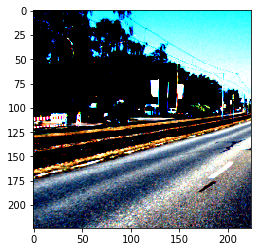

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


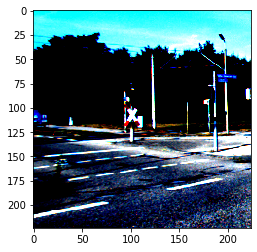

0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


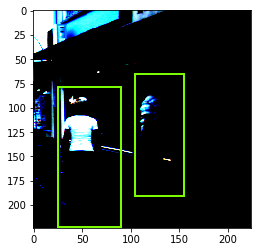

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


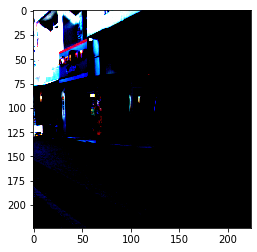

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


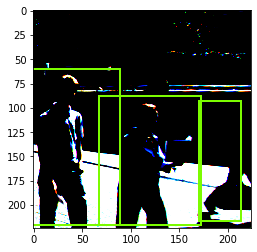

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


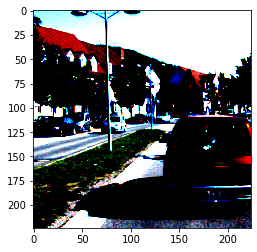

0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


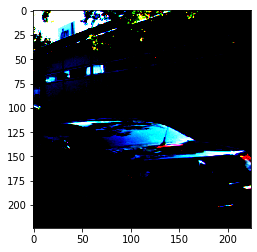

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


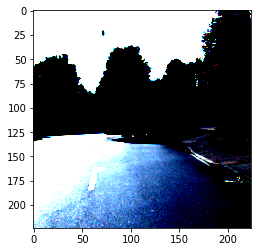

0.0 tensor([0.], device='cuda:0')


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([224, 224, 3])


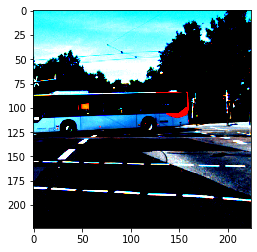

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


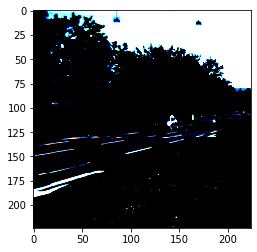

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


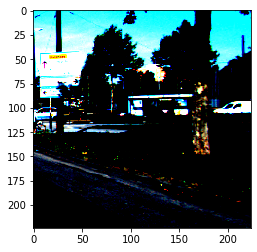

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


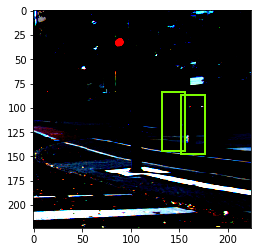

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


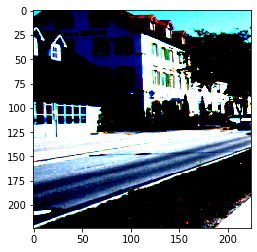

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


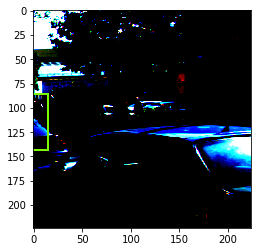

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


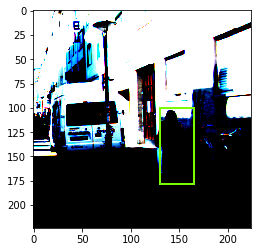

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


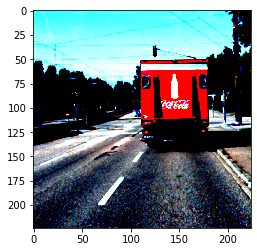

0.0 tensor([0.], device='cuda:0')


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([224, 224, 3])


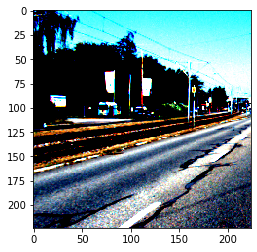

0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


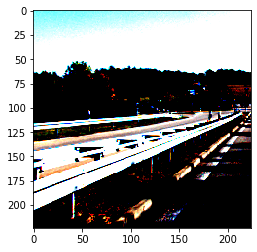

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


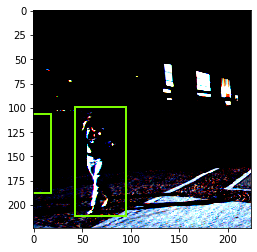

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


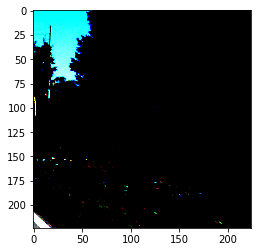

0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


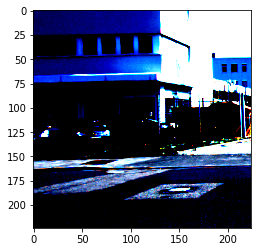

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


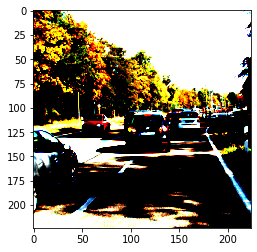

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


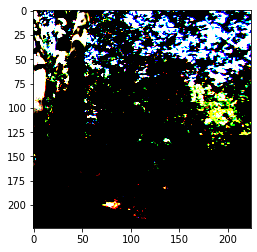

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


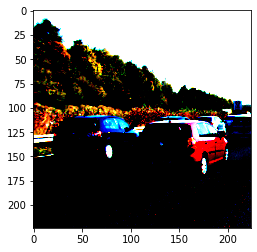

0.0 tensor([0.], device='cuda:0')


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([224, 224, 3])


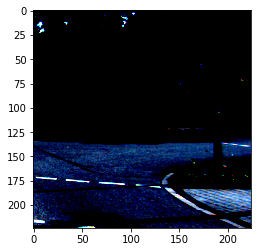

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


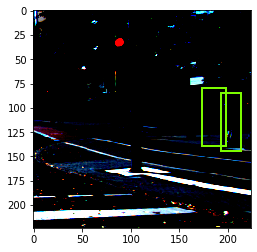

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


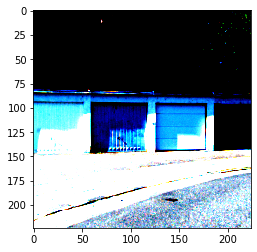

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


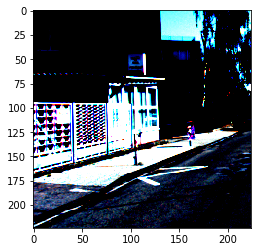

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


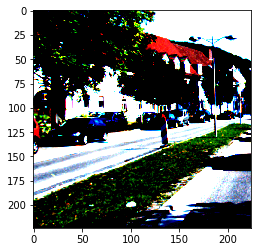

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


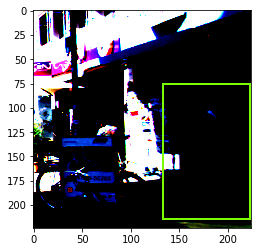

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


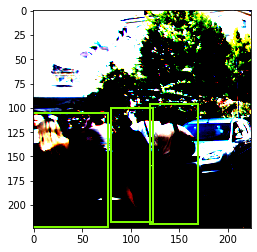

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


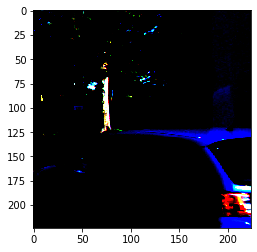

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


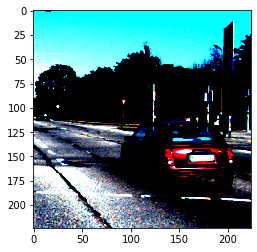

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


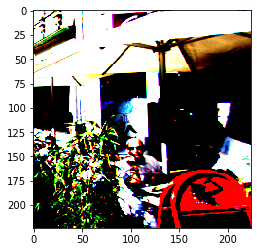

1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


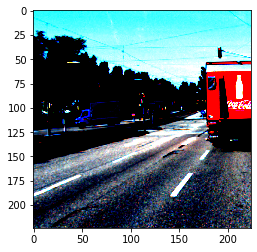

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


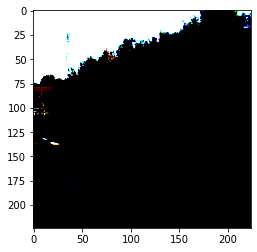

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


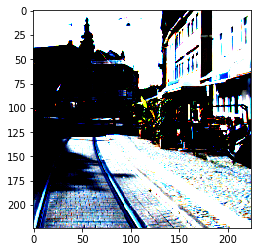

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


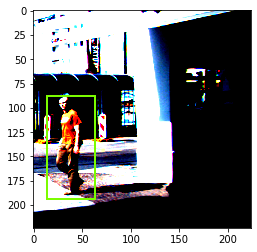

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


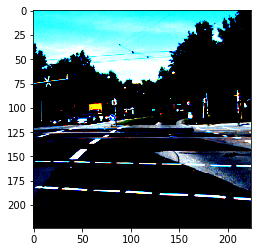

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


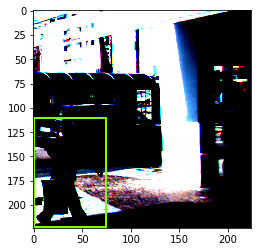

1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


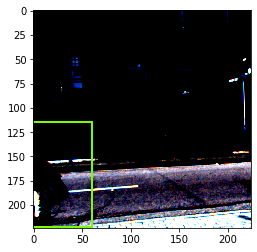

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


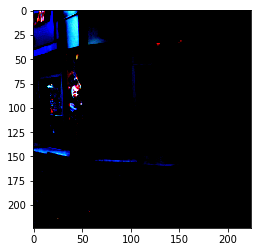

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


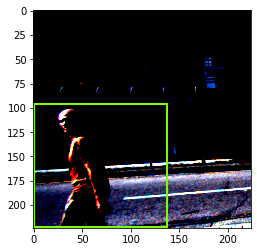

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


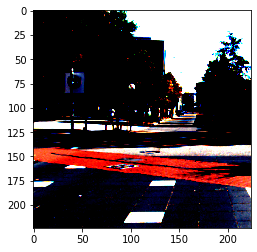

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


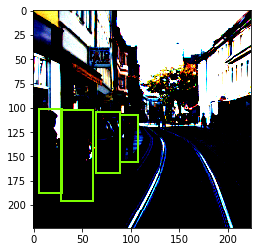

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


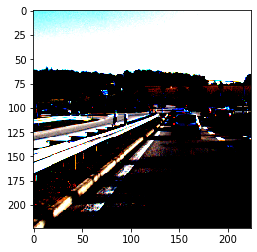

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


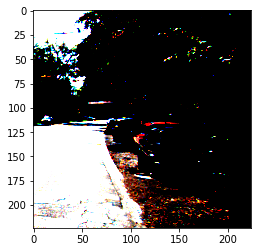

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


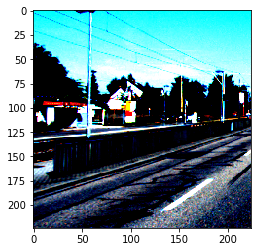

0.0 tensor([0.], device='cuda:0')


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([224, 224, 3])


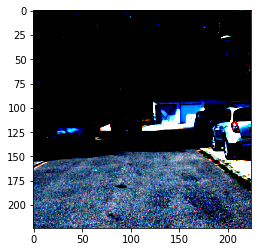

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


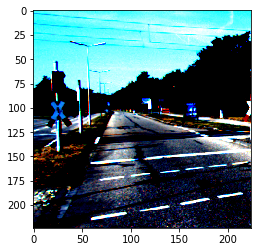

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


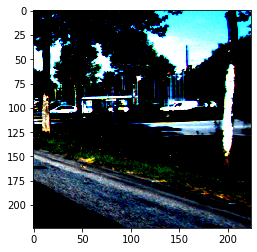

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


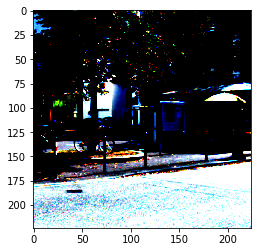

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


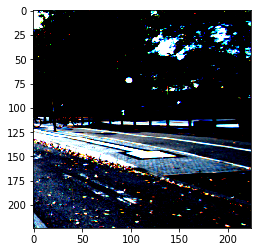

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


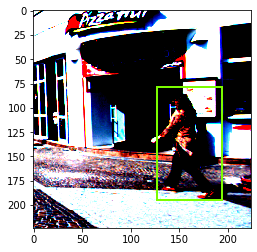

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


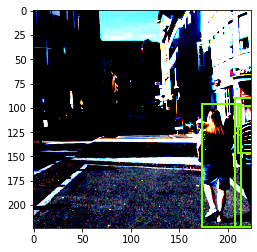

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


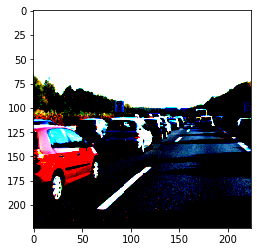

0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


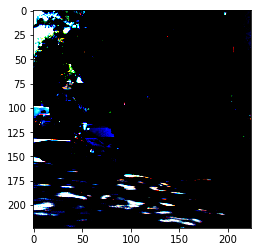

0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


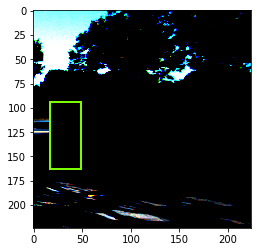

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


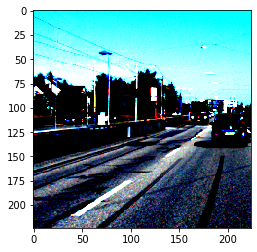

0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


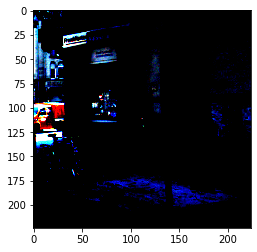

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


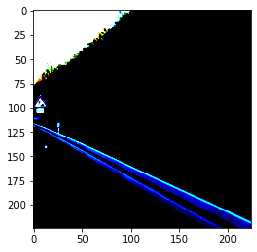

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


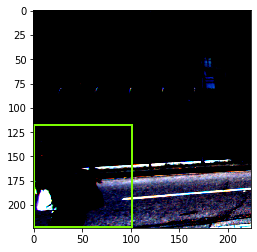

1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


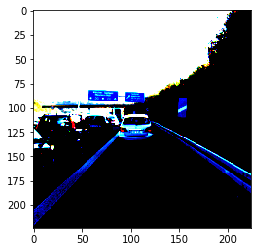

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


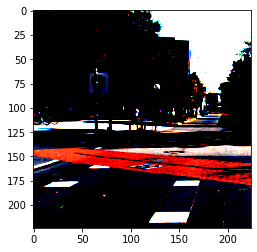

1.0 tensor([1.], device='cuda:0')


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([224, 224, 3])


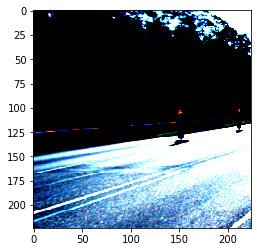

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


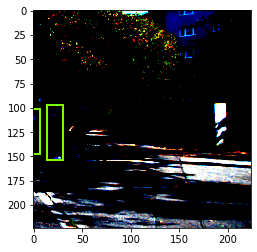

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


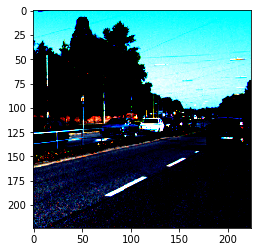

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


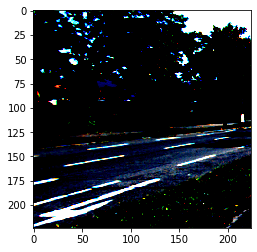

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


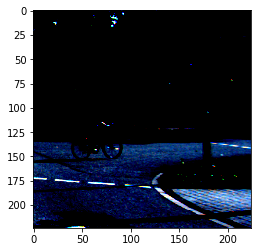

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


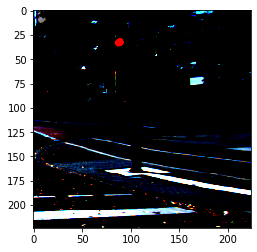

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


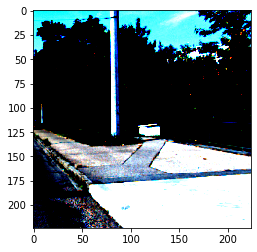

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


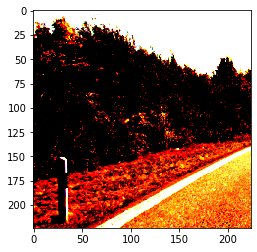

0.0 tensor([0.], device='cuda:0')


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([224, 224, 3])


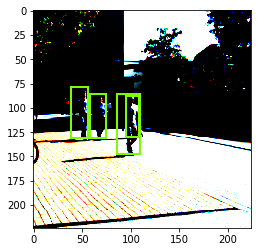

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


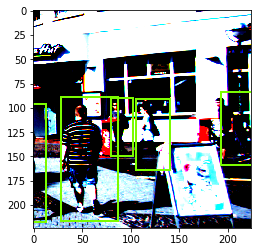

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


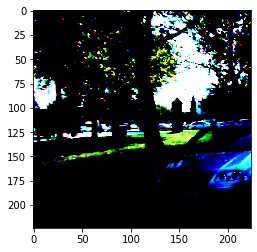

0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


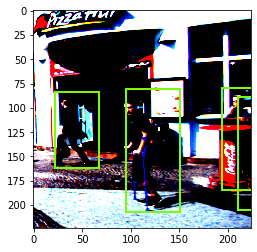

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


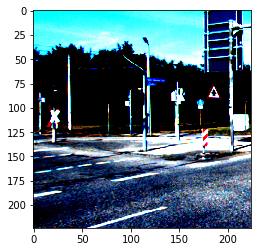

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


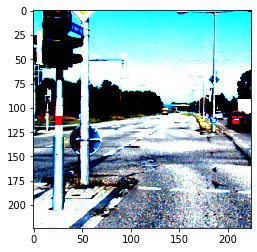

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


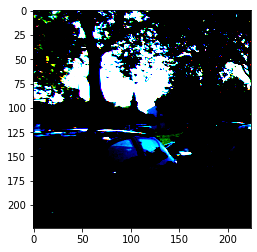

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


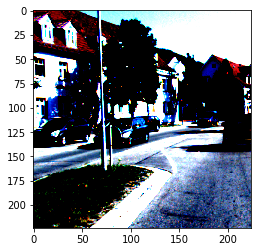

0.0 tensor([0.], device='cuda:0')


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([224, 224, 3])


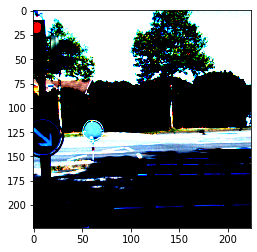

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


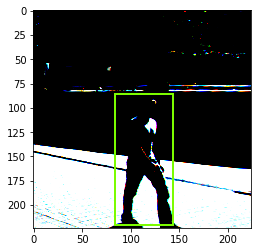

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


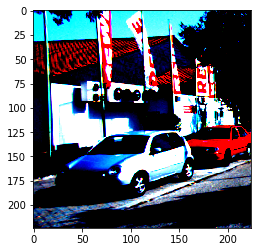

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


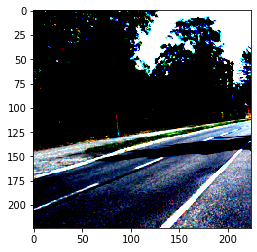

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([0.], device='cuda:0')
torch.Size([224, 224, 3])


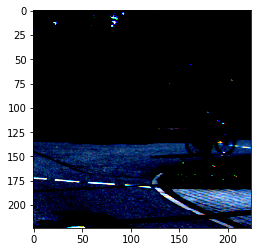

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


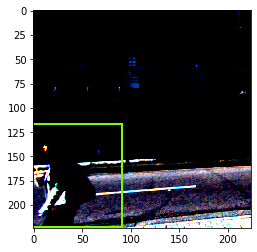

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


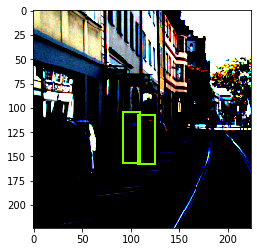

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0 tensor([1.], device='cuda:0')
torch.Size([224, 224, 3])


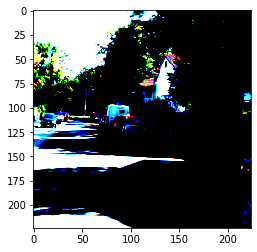

0.0 tensor([0.], device='cuda:0')


In [20]:
# TODO: Maybe visualize some of the classification results?

def vis_model(model, criterions, dataloaders):
    
    # Each epoch has a training and validation phase
    model.eval()   # Set model to evaluate mode

    running_loss = 0.0
    running_corrects = 0

    # Iterate over data.
    for batch_id, (imgT, targetT) in enumerate(dataloaders["test"]):
        if batch_id > 10: break

        inputs = imgT.to(device)
        labels = torch.FloatTensor([t["label"] for t in targetT])[:, None].to(device)

        # forward
        # track history if only in train
        with torch.set_grad_enabled(False):
            outputs = model(inputs)
            preds = (outputs > 0.).float()
#             print(preds)

        # For debug visualization
        for img, target, pred in zip(imgT, targetT, preds):
            raw_img = img.permute(1, 2, 0)
            print(raw_img.shape)
            plt.imshow(raw_img)
            ax = plt.gca()
            for bbox in target["bboxs"]:
                bbox_l, bbox_r, bbox_t, bbox_b = bbox
                rect = patches.Rectangle((bbox_l, bbox_t), (bbox_r - bbox_l), (bbox_b - bbox_t), linewidth=2, edgecolor='lawngreen', facecolor='none')
                ax.add_patch(rect)
            plt.show()
            print(target["label"], pred)
        



vis_model(best_model, criterion, dataloaders)

In [11]:
# Now we try to adapt the model architecture to generate class activation maps

fcn = torchvision.models.resnet152(pretrained=True)
# fcn._modules[-2] = torch.nn.Conv2d(512, 2, kernel_size=1, stride=1, padding=0)
for param in fcn.parameters():
    param.requires_grad = False

fcn.avgpool = torch.nn.Conv2d(2048, 2, kernel_size=1, stride=1, padding=0)
model_fc = nn.Sequential(*list(fcn.children())[:-1]).cuda()

model_fc

Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)


In [12]:
import torch.nn.functional as F
def MIL_loss(activation_maps, labels):

    cam_shape = activation_maps.shape
    n_batch, n_class = cam_shape[0], cam_shape[1]
    labels = F.one_hot(labels.long(), n_class).view(n_batch, n_class)
    #print(labels, labels.shape)
    
    flatten_maps = activation_maps.view(n_batch, n_class, -1) #B x K x (W*H)
    flatten_maps = torch.softmax(flatten_maps, dim=2) # B x K x (W*H)
    #print("fm", flatten_maps.shape)
    instance_logits = torch.max(flatten_maps, dim=2, keepdim=False)[0] # B x K
    #print("il", instance_logits.shape)

    mil_loss = -torch.mean(torch.sum(labels * torch.log(instance_logits), dim=1), dim=0) # scalar
    return mil_loss

# test
# cam = torch.rand(4, 49, 49, 2)
# labels = torch.LongTensor(4).random_(0, 2)

# MIL_loss(cam, labels)


# def MILL(element_logits, seq_len, batch_size, labels, device):
#     ''' element_logits should be torch tensor of dimension (B, n_element, n_class),
#          k should be numpy array of dimension (B,) indicating the top k locations to average over, 
#          labels should be a numpy array of dimension (B, n_class) of 1 or 0
#          return is a torch tensor of dimension (B, n_class) '''

#     k = np.ceil(seq_len/8).astype('int32')
#     labels = labels / torch.sum(labels, dim=1, keepdim=True)
#     instance_logits = torch.zeros(0).to(device)
#     for i in range(batch_size):
#         tmp, _ = torch.topk(element_logits[i][:seq_len[i]], k=int(k[i]), dim=0)
#         instance_logits = torch.cat([instance_logits, torch.mean(tmp, 0, keepdim=True)], dim=0)
#     milloss = -torch.mean(torch.sum(Variable(labels) * F.log_softmax(instance_logits, dim=1), dim=1), dim=0)
#     return milloss    

In [18]:
device = torch.device("cuda")

"""
Train size: 3540
Val size: 505
Test size: 1013
"""
dataset_sizes = {
    "train": 3540.,
    "val": 505.,
    "test":  1013.
}

def train_mil_model(model, criterion, optimizer, scheduler, dataloaders, num_epochs=10):
    
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_loss = float('inf')


    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0

            # Iterate over data.
            # for inputs, labels in dataloaders[phase]:
            for batch_id, (imgT, targetT) in enumerate(dataloaders[phase]):
                inputs = imgT.to(device)
                labels = torch.FloatTensor([t["label"] for t in targetT])[:, None].to(device)
                # print("labels", labels.shape)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]

            print('{} Loss: {:.4f}'.format(phase, epoch_loss))

            # deep copy the model
            if phase == 'val' and epoch_loss < best_loss:
                best_loss = epoch_loss
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    print('Best val loss: {:4f}'.format(best_loss))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

criterion = MIL_loss
# Observe that all parameters are being optimized
# optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
optimizer = optim.Adam(model_fc.parameters(), lr=0.001)

# Decay LR by a factor of 0.3 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.3)

best_model = train_mil_model(model_fc, criterion, optimizer, exp_lr_scheduler, dataloaders, 15)


Epoch 0/14
----------
train Loss: 0.0450
val Loss: 0.1176

Epoch 1/14
----------
train Loss: 0.0283
val Loss: 0.1087

Epoch 2/14
----------
train Loss: 0.0190
val Loss: 0.0973

Epoch 3/14
----------
train Loss: 0.0141
val Loss: 0.0910

Epoch 4/14
----------
train Loss: 0.0108
val Loss: 0.0861

Epoch 5/14
----------
train Loss: 0.0084
val Loss: 0.0818

Epoch 6/14
----------
train Loss: 0.0066
val Loss: 0.0785

Epoch 7/14
----------
train Loss: 0.0056
val Loss: 0.0791

Epoch 8/14
----------
train Loss: 0.0048
val Loss: 0.0778

Epoch 9/14
----------
train Loss: 0.0044
val Loss: 0.0769

Epoch 10/14
----------
train Loss: 0.0041
val Loss: 0.0760

Epoch 11/14
----------
train Loss: 0.0038
val Loss: 0.0751

Epoch 12/14
----------
train Loss: 0.0035
val Loss: 0.0743

Epoch 13/14
----------
train Loss: 0.0032
val Loss: 0.0735

Epoch 14/14
----------
train Loss: 0.0028
val Loss: 0.0738

Training complete in 7m 45s
Best val loss: 0.073496


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([224, 224, 3])


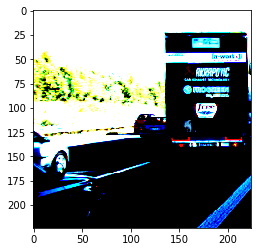

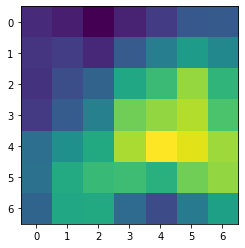

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([[[ 45.5157,  39.7680,  27.5538,  41.3006,  52.9921,  67.6355,  68.8257],
         [ 49.5859,  53.9871,  44.6552,  69.7589,  90.1328, 108.4507,  95.8786],
         [ 49.0807,  62.9174,  74.0245, 114.8344, 127.2610, 150.5214, 123.2700],
         [ 52.2373,  70.1161,  91.3734, 142.1302, 149.9804, 157.0099, 132.1703],
         [ 81.1923, 101.0086, 116.6004, 155.2816, 173.6908, 167.3735, 152.0893],
         [ 81.9900, 116.6270, 126.7722, 128.2650, 120.3537, 141.9678, 149.7764],
         [ 74.8548, 114.8767, 116.2357,  78.5124,  60.9938,  88.3557, 110.7775]],

        [[ 47.2432,  38.2130,  25.2822,  35.8714,  39.8587,  49.9155,  53.7691],
         [ 49.5611,  52.6149,  44.8075,  61.4663,  64.3227,  77.1162,  68.3091],
         [ 49.8328,  64.8858,  80.9701, 112.2007, 103.2173, 118.2129, 100.4421],
         [ 50.2631,  70.9693,  90.2933, 132.9696, 134.5039, 128.6416, 110.5256],
         [ 81.2952, 105.3295, 117.8512, 136.8813, 146.5727, 135.5798, 121.9806],
         [ 90.2662, 12

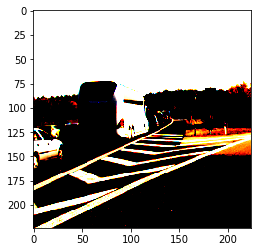

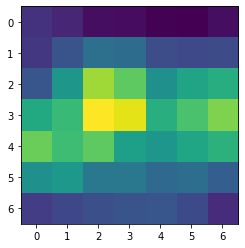

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.0 tensor([[[ 46.5718,  40.4582,  29.2710,  28.9101,  24.9997,  23.7830,  29.5546],
         [ 48.9280,  64.1021,  81.6841,  78.8608,  60.9105,  58.5215,  59.6941],
         [ 65.4597, 106.2051, 157.6420, 141.4203, 101.8944, 114.8925, 120.9281],
         [118.4651, 128.8552, 179.8220, 173.6737, 122.2156, 134.9465, 149.6978],
         [144.7250, 131.2279, 141.1499, 111.7918, 105.5582, 115.7335, 123.7631],
         [102.1216, 106.6922,  86.2398,  86.2603,  76.8744,  80.3999,  70.1941],
         [ 52.2000,  57.4524,  61.7614,  64.5477,  65.6573,  59.0414,  43.7511]],

        [[ 47.9210,  38.3731,  26.8488,  25.3084,  21.5470,  20.7575,  24.9337],
         [ 46.7853,  58.9171,  73.0145,  70.1845,  54.2686,  60.3531,  61.6474],
         [ 62.0946,  91.5070, 134.0283, 113.2057,  89.3113, 116.4699, 128.1569],
         [125.1801, 122.5749, 154.8981, 150.4555, 121.6517, 142.5881, 164.4896],
         [146.6862, 133.5551, 137.4257, 116.8321, 105.7947, 126.4235, 128.2190],
         [105.9581, 10

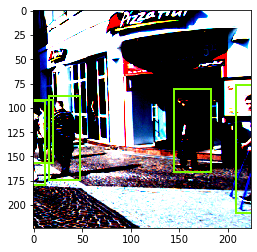

In [ ]:
# TODO: Maybe visualize some of the classification results?

def vis_mil_model(model, criterions, dataloaders):
    
    # Each epoch has a training and validation phase
    model.eval()   # Set model to evaluate mode

    running_loss = 0.0
    running_corrects = 0

    # Iterate over data.
    for batch_id, (imgT, targetT) in enumerate(dataloaders["test"]):
        if batch_id > 0: break

        inputs = imgT.to(device)
        labels = torch.FloatTensor([t["label"] for t in targetT])[:, None].to(device)

        # forward
        # track history if only in train
        with torch.set_grad_enabled(False):
            outputs = model(inputs)
            preds = outputs.float()
            #preds = (outputs > 0.).float()

        # For debug visualization
        for img, target, pred in zip(imgT, targetT, preds):
            raw_img = img.permute(1, 2, 0)
            print(raw_img.shape)
            plt.imshow(raw_img)
            ax = plt.gca()
            for bbox in target["bboxs"]:
                bbox_l, bbox_r, bbox_t, bbox_b = bbox
                rect = patches.Rectangle((bbox_l, bbox_t), (bbox_r - bbox_l), (bbox_b - bbox_t), linewidth=2, edgecolor='lawngreen', facecolor='none')
                ax.add_patch(rect)
            plt.show()
#             for p in pred:
            p = pred[int(target["label"])].cpu().numpy()
            plt.imshow(p)
            plt.show()
            print(target["label"], pred)
#         input()
        



vis_mil_model(best_model, criterion, dataloaders)

In [132]:
# Calculate average bounding box size
DEBUG = False

avg_box_height = []
avg_box_width = []
for index, row in tqdm(balanced_image_class_info[balanced_image_class_info["class"] == 1].iterrows()):

    # Load frame label
    label_file = "%s%s.txt" % (train_label_dir, row["video_id"])
    label = pd.read_csv(label_file, sep=" ", names=HEADER)
    label = label[(label["frame"] == row["frame_id"]) & (label["type"] == "Pedestrian")]

    # Read image from file
    if DEBUG:
        img = mpimg.imread(row["image_path"])
        plt.imshow(img)
        ax = plt.gca()

    # Draw bounding box for pedestrian
    for tup in label[["bbox_l", "bbox_t", "bbox_r", "bbox_b"]].to_numpy():
        avg_box_height.append(tup[3]-tup[1])
        avg_box_width.append(tup[2]-tup[0])
        if DEBUG:
            rect = patches.Rectangle((tup[0], tup[1]), (tup[2]-tup[0]), (tup[3]-tup[1]), linewidth=2, edgecolor='lawngreen', facecolor='none')
            ax.add_patch(rect)
        
    if DEBUG:
        plt.show()
#     break

print("height:", sum(avg_box_height)/len(avg_box_height))
print("width:", sum(avg_box_width)/len(avg_box_width))

2529it [00:33, 74.94it/s]

height: 115.27319254943286
width: 50.38826303243228


0it [00:00, ?it/s]

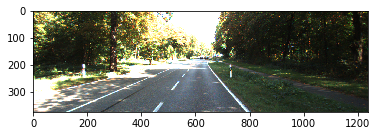

0 125 0 125


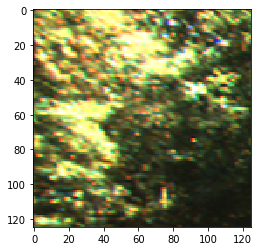

0 125 125 250


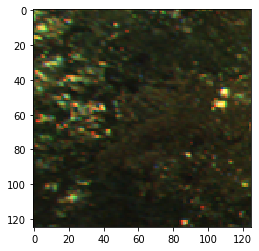

0 125 250 375


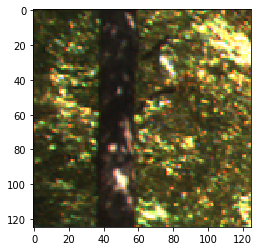

0 125 375 500


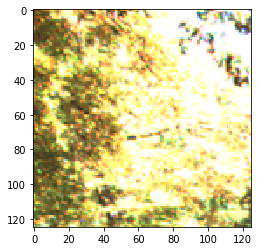

0 125 500 625


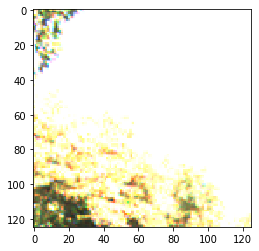

0 125 625 750


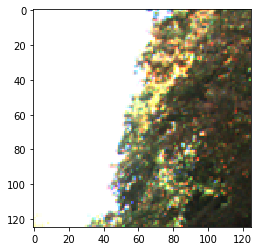

0 125 750 875


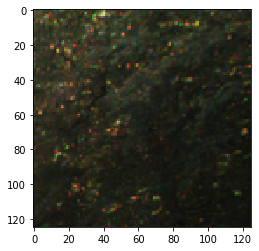

0 125 875 1000


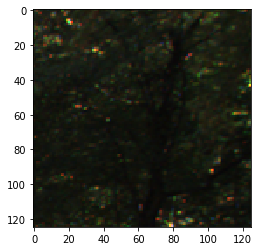

0 125 1000 1125


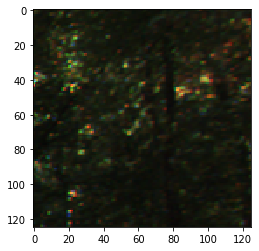

0 125 1113 1238


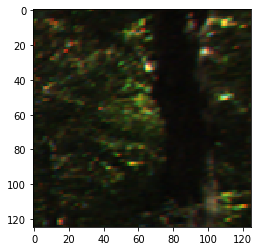

125 250 0 125


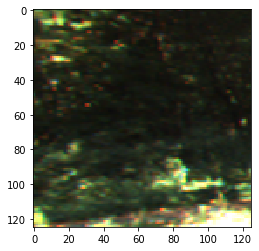

125 250 125 250


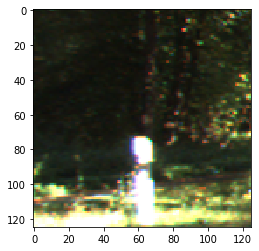

125 250 250 375


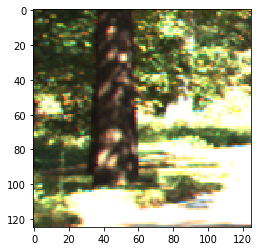

125 250 375 500


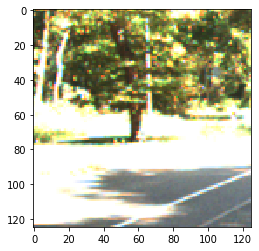

125 250 500 625


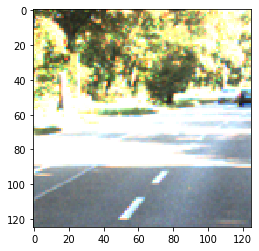

125 250 625 750


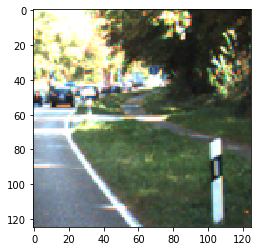

125 250 750 875


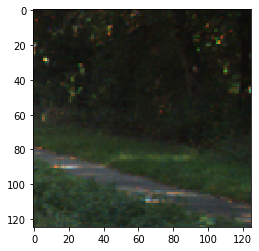

125 250 875 1000


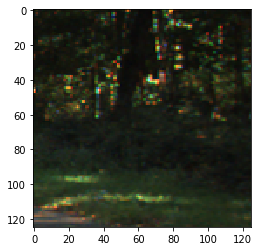

125 250 1000 1125


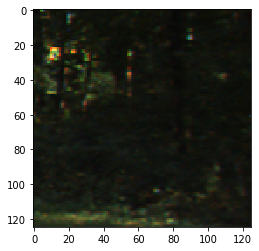

125 250 1113 1238


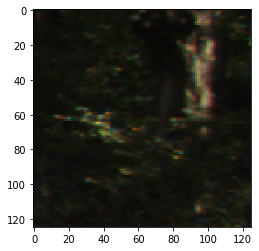

249 374 0 125


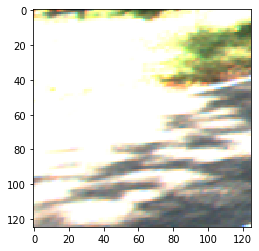

249 374 125 250


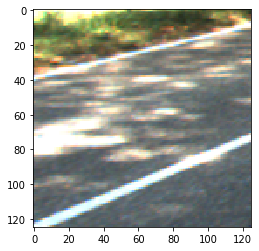

249 374 250 375


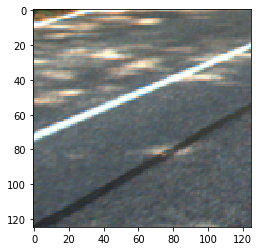

249 374 375 500


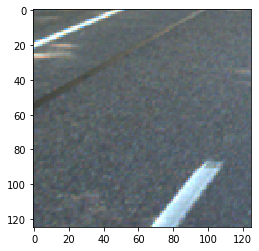

249 374 500 625


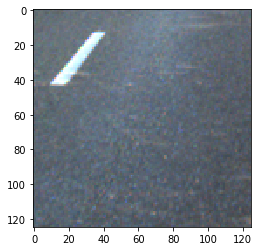

249 374 625 750


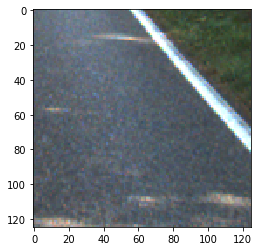

249 374 750 875


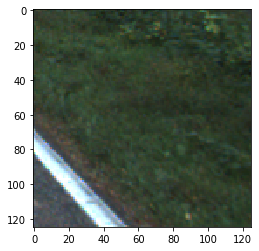

249 374 875 1000


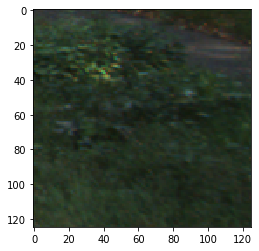

249 374 1000 1125


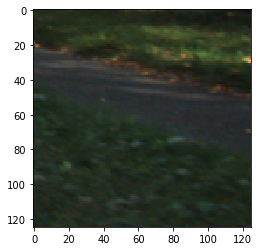

249 374 1113 1238


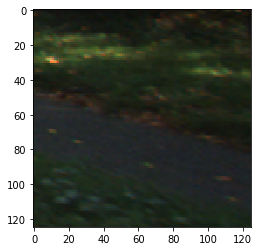

1it [00:04,  4.93s/it]

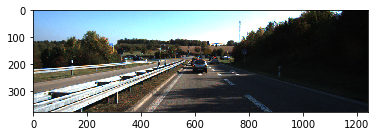

0 125 0 125


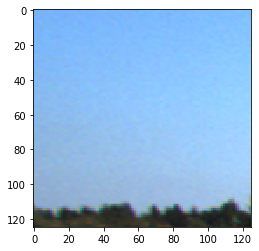

0 125 125 250


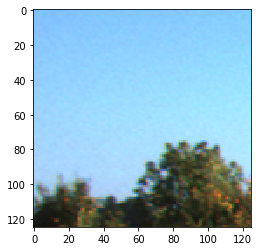

0 125 250 375


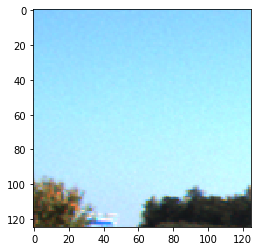

0 125 375 500


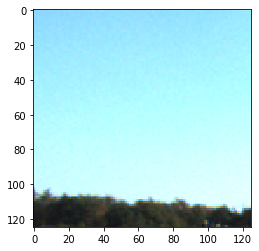

0 125 500 625


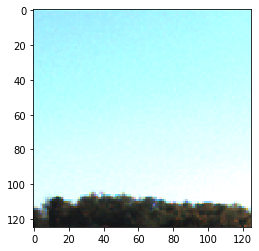

0 125 625 750


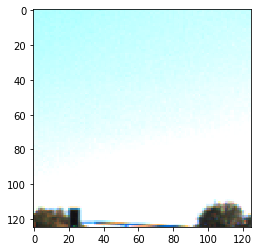

0 125 750 875


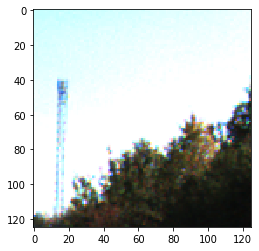

0 125 875 1000


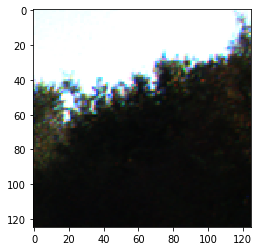

0 125 1000 1125


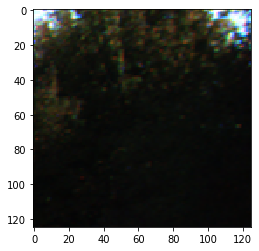

0 125 1116 1241


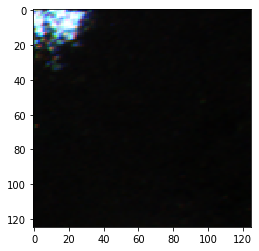

125 250 0 125


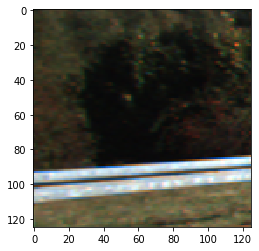

125 250 125 250


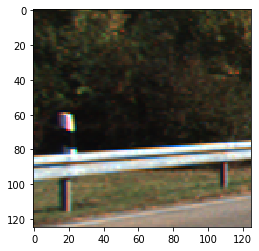

125 250 250 375


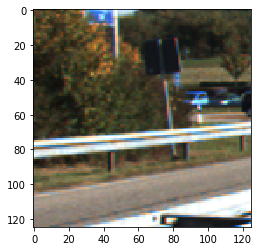

125 250 375 500


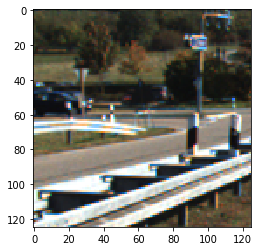

125 250 500 625


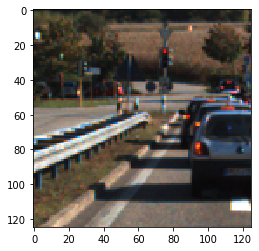

125 250 625 750


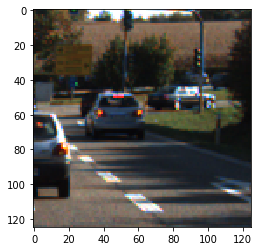

125 250 750 875


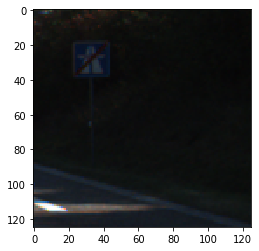

125 250 875 1000


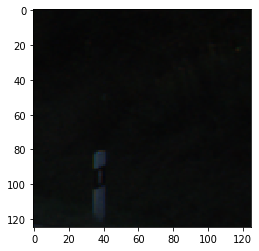

125 250 1000 1125


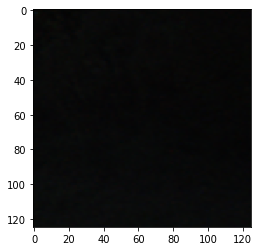

125 250 1116 1241


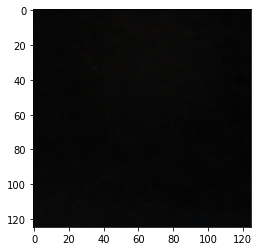

250 375 0 125


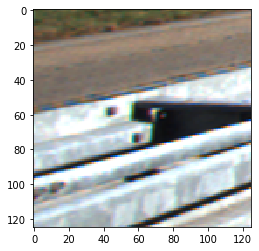

250 375 125 250


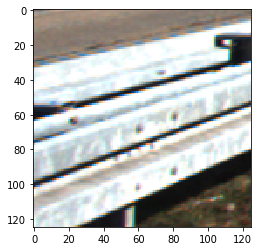

250 375 250 375


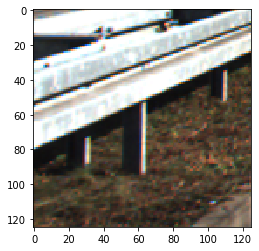

250 375 375 500


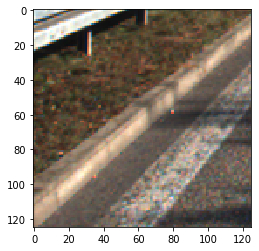

250 375 500 625


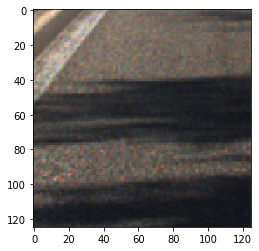

250 375 625 750


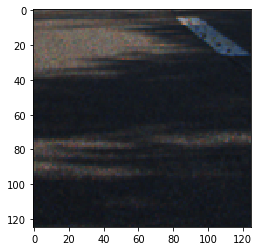

250 375 750 875


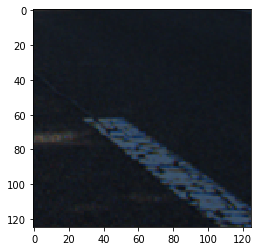

250 375 875 1000


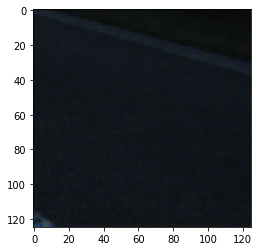

250 375 1000 1125


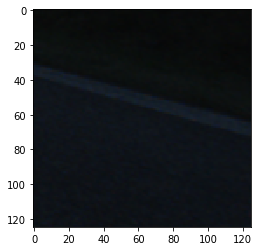

250 375 1116 1241


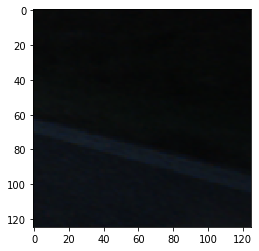

251 376 0 125


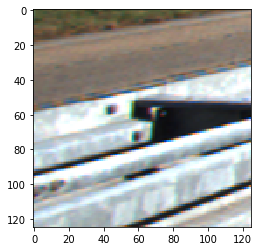

251 376 125 250


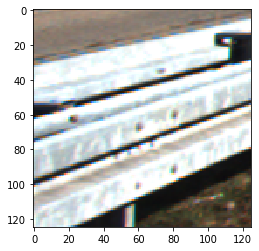

251 376 250 375


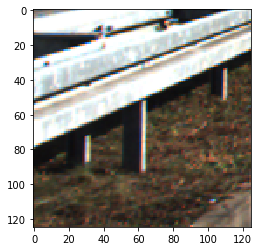

251 376 375 500


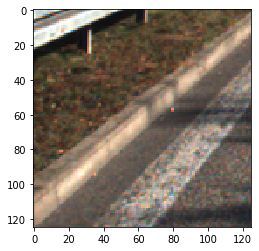

251 376 500 625


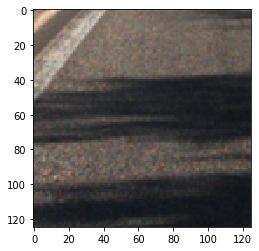

251 376 625 750


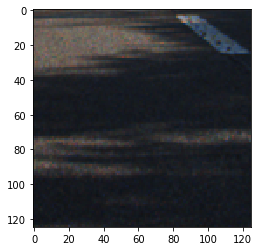

251 376 750 875


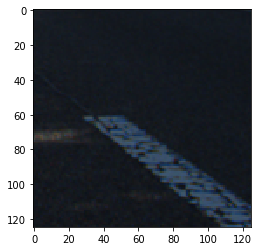

251 376 875 1000


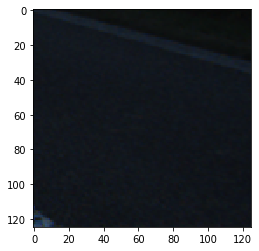

251 376 1000 1125


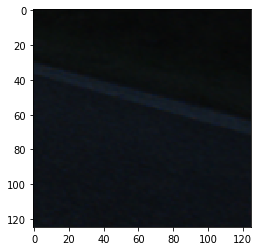

251 376 1116 1241


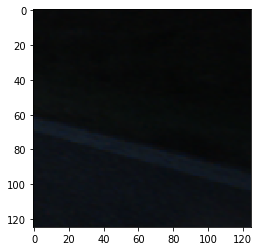

2it [00:11,  5.39s/it]

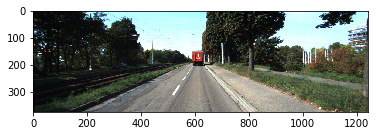

0 125 0 125


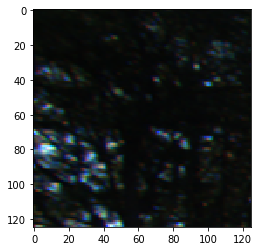

0 125 125 250


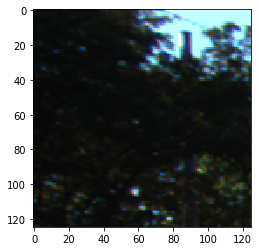

0 125 250 375


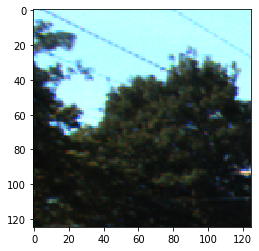

0 125 375 500


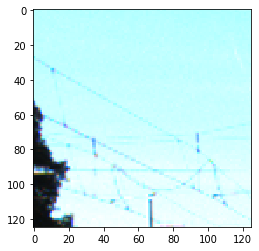

0 125 500 625


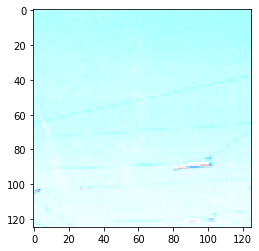

0 125 625 750


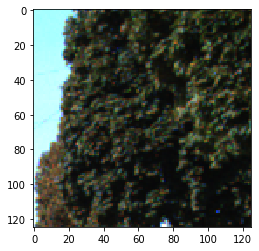

0 125 750 875


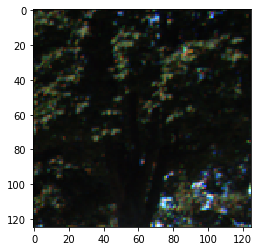

0 125 875 1000


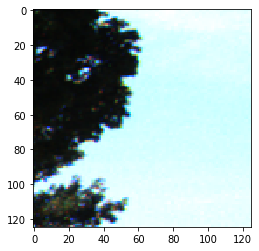

0 125 1000 1125


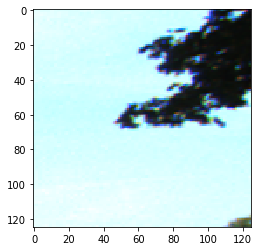

0 125 1117 1242


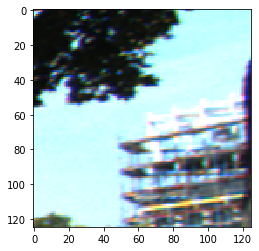

125 250 0 125


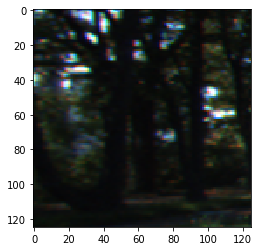

125 250 125 250


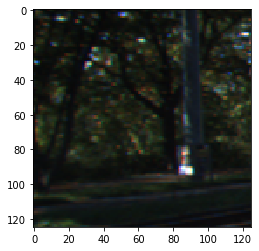

125 250 250 375


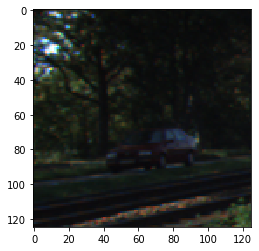

125 250 375 500


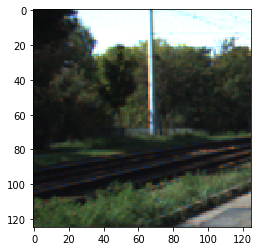

125 250 500 625


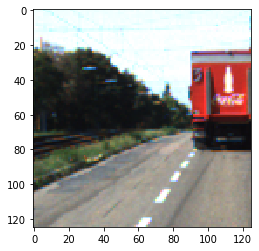

125 250 625 750


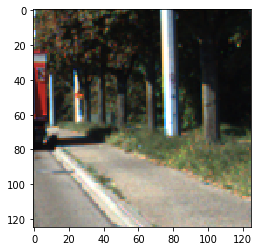

125 250 750 875


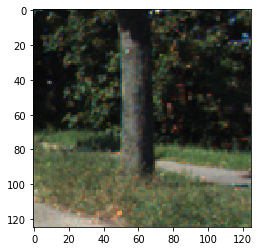

125 250 875 1000


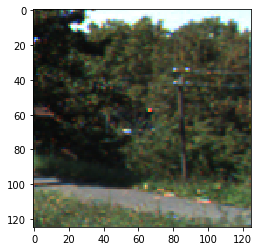

125 250 1000 1125


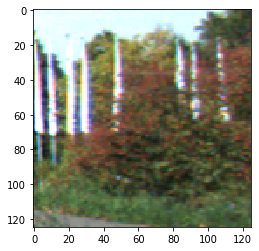

125 250 1117 1242


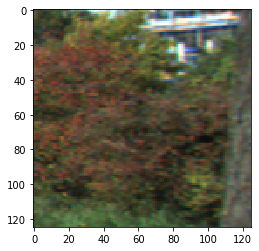

250 375 0 125


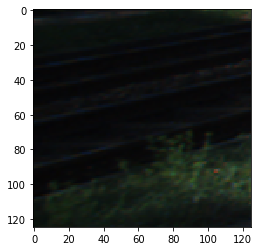

250 375 125 250


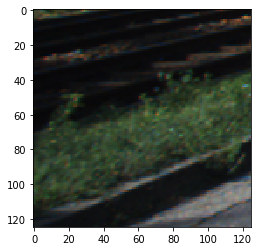

250 375 250 375


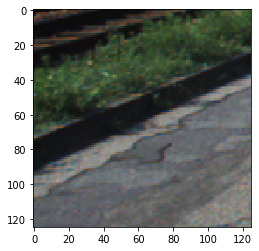

250 375 375 500


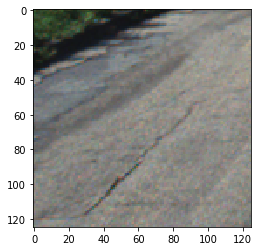

250 375 500 625


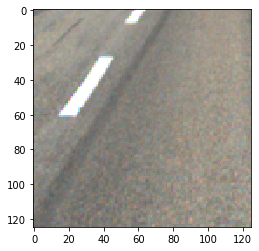

250 375 625 750


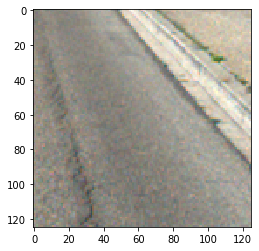

250 375 750 875


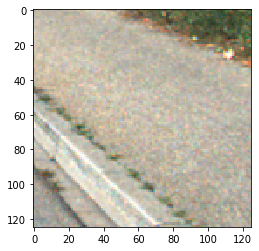

250 375 875 1000


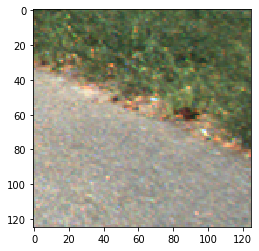

250 375 1000 1125


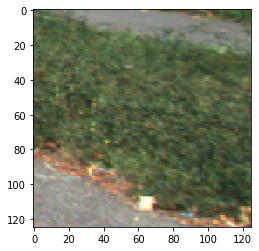

250 375 1117 1242


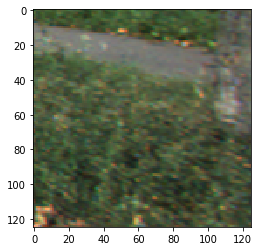

3it [00:16,  5.26s/it]

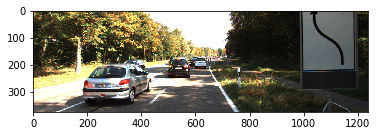

0 125 0 125


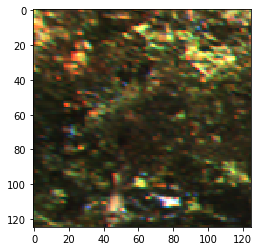

0 125 125 250


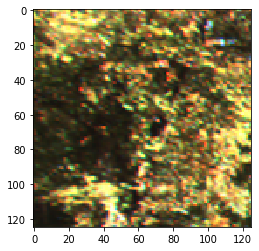

0 125 250 375


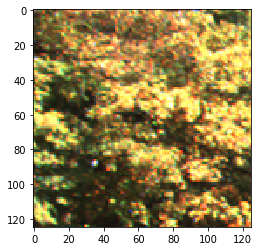

0 125 375 500


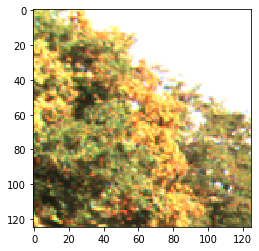

0 125 500 625


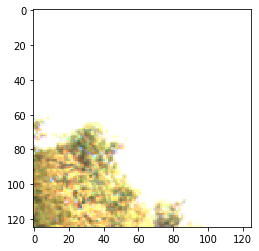

0 125 625 750


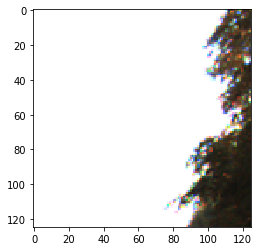

0 125 750 875


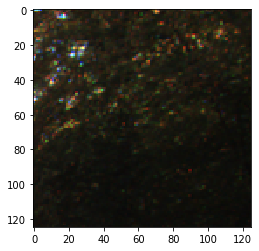

0 125 875 1000


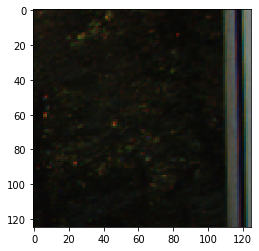

0 125 1000 1125


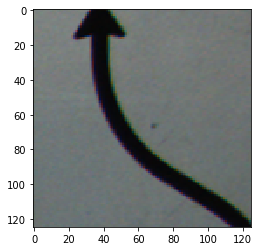

0 125 1113 1238


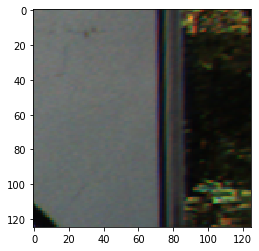

125 250 0 125


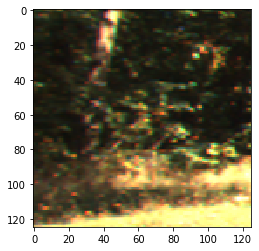

125 250 125 250


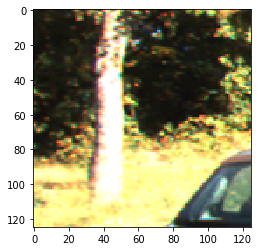

125 250 250 375


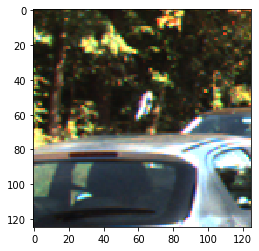

125 250 375 500


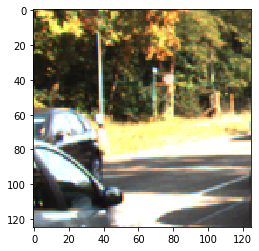

125 250 500 625


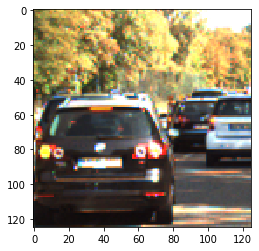

125 250 625 750


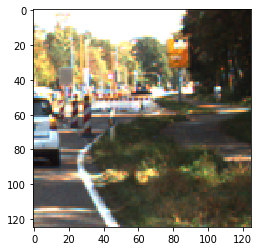

125 250 750 875


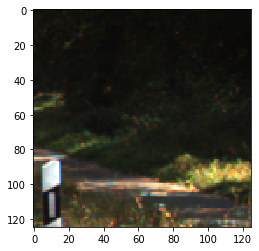

125 250 875 1000


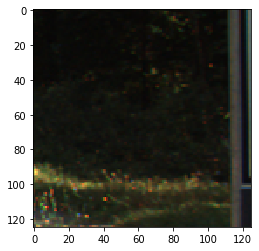

125 250 1000 1125


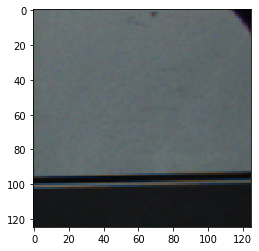

125 250 1113 1238


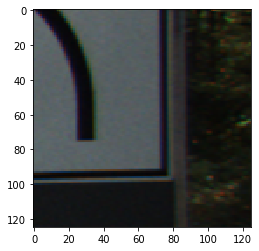

249 374 0 125


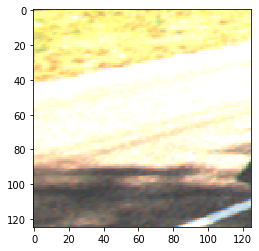

249 374 125 250


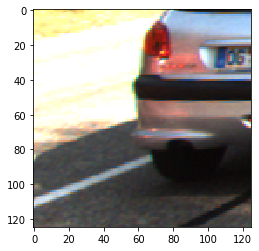

249 374 250 375


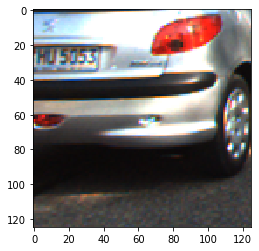

249 374 375 500


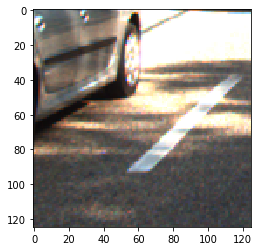

249 374 500 625


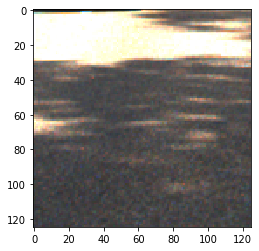

249 374 625 750


In [ ]:
# Crop into NxN tile (dump to disk or not?)

# Set stride dynamically for the tiles close to the boundary
# Return generator of image tiles
def crop_to_non_overlap_tile(img, N):
    idx_l, idx_t = 0, 0
    while 0 <= idx_t < img.shape[0]:
        if idx_t + N > img.shape[0]:
            idx_t = img.shape[0]-N

        while 0 <= idx_l < img.shape[1]:
            if idx_l + N > img.shape[1]:
                idx_l = img.shape[1]-N

            tile = img[idx_t:idx_t+N, idx_l:idx_l+N]
            print(idx_t, idx_t+N, idx_l, idx_l+N)
            yield tile
            idx_l += N

        idx_l = 0
        idx_t += N

N = 125

for i, (index, row) in tqdm(enumerate(balanced_image_class_info.iterrows())):

    # Read image from file
    img = cv2.imread(row["image_path"]) # Default BGR encoding
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    plt.imshow(img)
    plt.show()
    
    
    for tile in crop_to_non_overlap_tile(img, N):
        # TODO: Do something with the cropped tiles...
        plt.imshow(tile)
        plt.show()
    

    if i == 5:
        break
